In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#### 1. GPT-4 Vision API 이해하기
GPT-4 Vision API는 이미지 입력과 텍스트 프롬프트를 받아 이미지에 대한 상세한 설명이나 질문에 대한 답변을 생성해 줍니다. 이를 통해 이미지 캡셔닝, 장면 이해 등 다양한 작업에 활용할 수 있습니다.

In [ ]:
!pip install openai av matplotlib pillow

import av
import openai
import base64
import io
import numpy as np
import matplotlib.pyplot as plt
import math
from PIL import Image
import time
import base64

In [ ]:
# OpenAI API 키 설정
OPENAI_KEY = "XXXXXXXXXX"  # 실제 API 키로 대체하세요

In [ ]:
from openai import OpenAI

client = OpenAI(api_key=OPENAI_KEY)

In [ ]:
def read_video_pyav(container, frame_indices):
    frames = []  # 추출된 프레임을 저장할 리스트 초기화
    frame_counter = 0  # 현재 프레임 번호를 추적하기 위한 카운터 초기화
    frame_indices_set = set(frame_indices)  # 빠른 검색을 위해 프레임 인덱스 목록을 집합(set)으로 변환

    # 비디오 컨테이너로부터 프레임을 순차적으로 디코딩
    for frame in container.decode(video=0):
        # 현재 프레임 번호가 추출 대상 프레임 인덱스에 포함되어 있는지 확인
        if frame_counter in frame_indices_set:
            # 프레임을 RGB 포맷의 NumPy 배열로 변환
            img = frame.to_rgb().to_ndarray()
            # 변환된 이미지를 프레임 리스트에 추가
            frames.append(img)
            # 모든 대상 프레임을 추출했으면 루프 종료
            if len(frames) == len(frame_indices):
                break
        # 다음 프레임으로 이동하기 위해 카운터 증가
        frame_counter += 1

    # 추출된 프레임들을 NumPy 배열로 반환
    return np.array(frames)

In [ ]:
def download_and_sample_video_local(video_path, start_time=0, duration=60, frame_interval=3):
    try:
        # 비디오 파일 열기
        container = av.open(video_path)
    except FileNotFoundError:
        print(f"비디오 파일을 찾을 수 없습니다: {video_path}")
        return None
    except av.AVError as e:
        print(f"비디오 파일을 여는 중 오류가 발생했습니다: {e}")
        return None

    # 첫 번째 비디오 스트림 가져오기
    stream = container.streams.video[0]
    # 평균 프레임 레이트(FPS) 가져오기
    fps = float(stream.average_rate)
    if fps is None or fps == 0:
        fps = 30.0  # 기본 FPS 값 설정

    # 세그먼트 내에서 추출할 프레임의 타임스탬프 계산
    num_frames = int(duration / frame_interval) + 1  # 추출할 프레임 수 계산
    timestamps = [
        start_time + i * frame_interval
        for i in range(num_frames)
        if start_time + i * frame_interval <= start_time + duration
    ]  # 각 프레임의 타임스탬프 리스트 생성

    frames = []  # 추출된 프레임을 저장할 리스트
    index = 0    # 현재 타임스탬프 인덱스

    # 스트림의 time_base를 사용하여 PTS(프레젠테이션 타임스탬프) 계산
    seek_pts = int(start_time / stream.time_base)

    # 지정된 시작 위치로 이동
    container.seek(seek_pts, any_frame=False, backward=True, stream=stream)

    # 비디오 프레임 디코딩 및 프레임 추출
    for frame in container.decode(video=0):
        frame_time = frame.time  # 현재 프레임의 시간(초 단위)
        if frame_time is None:
            continue
        if frame_time < start_time:
            continue
        if frame_time >= start_time + duration:
            break  # 지정된 지속 시간(duration)을 초과하면 루프 종료

        # 현재 프레임의 시간이 추출할 타임스탬프와 일치하거나 그 이후인 경우
        while index < len(timestamps) and frame_time >= timestamps[index]:
            frames.append(frame.to_rgb().to_ndarray())  # 프레임을 RGB 포맷의 NumPy 배열로 변환하여 저장
            index += 1
            if index >= len(timestamps):
                break  # 모든 타임스탬프에 대한 프레임을 추출하면 루프 종료

    container.close()  # 비디오 컨테이너 닫기
    return np.array(frames)  # 추출된 프레임들을 NumPy 배열로 반환

In [ ]:
# 비디오 길이 가져오기 함수
def get_video_duration(video_path):
    try:
        container = av.open(video_path)
        stream = container.streams.video[0]
        duration = stream.duration * stream.time_base
        container.close()
        return duration
    except Exception as e:
        print(f"비디오 길이 가져오기 실패: {e}")
        return 0

In [ ]:
def encode_image(image, max_size=(256, 256)):
    # 이미지 리사이즈
    image.thumbnail(max_size)
    buffered = io.BytesIO()
    image.save(buffered, format="JPEG", quality=70)  # quality를 낮춰 파일 크기 줄이기
    img_b64_str = base64.b64encode(buffered.getvalue()).decode('utf-8')
    return img_b64_str

In [ ]:
def analyze_frames(frames, segment_idx, duration, segment_length, frame_interval=3):
    problematic_frames = []
    feedbacks = []

    num_frames = len(frames)
    time_stamps = [
        segment_idx * segment_length + i * frame_interval
        for i in range(num_frames)
    ]

    for i, (frame, frame_time_sec) in enumerate(zip(frames, time_stamps)):
        minutes = int(frame_time_sec // 60)
        seconds = int(frame_time_sec % 60)
        timestamp = f"{minutes}m {seconds}s"
        prompt = "이 야구 경기 비디오 프레임에서 선수들의 동작, 위치, 장비, 경기 상황 등을 포함하여 장면을 자세하고 포괄적으로 설명해 주세요."

        # 이미지를 축소 및 인코딩
        image = Image.fromarray(frame)
        img_b64_str = encode_image(image)

        img_type = "image/jpeg"

        try:
            response = client.chat.completions.create(
                model="gpt-3.5-turbo",
                messages=[
                    {
                        "role": "user",
                        "content": f"{prompt}\n\n이미지 데이터: data:{img_type};base64,{img_b64_str}"
                    }
                ],
                max_tokens=300,
            )

            # 생성된 설명 추출
            generated_text = response.choices[0].message.content
        except Exception as e:
            print(f"프레임 {i+1} 처리 중 오류 발생: {e}")
            generated_text = ""

        print(f"Segment {segment_idx+1}, Frame {i+1} ({timestamp}): {generated_text}\n")

        # 결과 표시
        plt.figure(figsize=(6, 4))
        plt.imshow(frame)
        plt.title(f"Segment {segment_idx+1}, Frame {i+1} ({timestamp})", fontsize=10)
        plt.axis('off')
        plt.show()

    return problematic_frames, feedbacks

In [ ]:
# 피드백 시각화 함수
def plot_problematic_frames(frames, feedbacks):
    if not frames:
        print("문제 있는 프레임이 없습니다.")
        return

    num_clips = len(frames)             # 총 문제 있는 프레임 수 계산
    cols = 2                            # 한 행에 표시할 이미지 수 설정
    rows = math.ceil(num_clips / cols)  # 필요한 행의 수 계산
    plt.figure(figsize=(15, 5 * rows))  # 전체 그림의 크기 설정

    for i, (frame, feedback) in enumerate(zip(frames, feedbacks)):
        plt.subplot(rows, cols, i+1)                       # 서브플롯 위치 지정
        plt.imshow(frame)                                  # 프레임 이미지 표시
        plt.title(feedback, fontsize=12, color='red')      # 제목에 피드백 표시
        plt.axis('off')                                    # 축 숨기기

    plt.tight_layout()  # 서브플롯 간 여백 조정
    plt.show()

In [ ]:
def main():
    video_path = "/content/drive/MyDrive/kakaotech-14-ai/test_video.mp4"  # 비디오 파일의 경로
    segment_length = 60  # 각 세그먼트의 길이 (초 단위)
    frame_interval = 3   # 프레임 추출 간격 (초 단위)

    # 비디오의 전체 길이(초 단위)를 가져옵니다.
    video_duration = get_video_duration(video_path)

    # 비디오를 세그먼트로 분할하기 위한 세그먼트 수 계산
    num_segments = math.ceil(video_duration / segment_length)
    print(f"비디오 전체 길이: {int(video_duration // 60)}분 {int(video_duration % 60)}초")
    print(f"총 {num_segments}개의 세그먼트로 분할됩니다.")

    all_segments_frames = []  # 모든 세그먼트의 프레임들을 저장할 리스트
    all_durations = []        # 각 세그먼트의 지속 시간을 저장할 리스트

    # 각 세그먼트별로 프레임을 추출합니다.
    for i in range(num_segments):
        start_time = i * segment_length  # 현재 세그먼트의 시작 시간 (초 단위)

        # 마지막 세그먼트의 지속 시간을 조정합니다.
        if i == num_segments - 1:
            duration = video_duration - start_time  # 남은 시간을 지속 시간으로 설정
        else:
            duration = segment_length  # 세그먼트 길이를 지속 시간으로 설정

        all_durations.append(duration)  # 세그먼트의 지속 시간을 저장

        print(f"샘플링 중인 세그먼트 {i+1}/{num_segments} (시작 시간: {int(start_time // 60)}분 {int(start_time % 60)}초)")

        # 해당 세그먼트에서 프레임을 추출합니다.
        clip = download_and_sample_video_local(
            video_path, start_time=start_time, duration=duration, frame_interval=frame_interval
        )

        # 추출된 프레임이 있으면 리스트에 추가합니다.
        if clip is not None and len(clip) > 0:
            all_segments_frames.append(clip)
        else:
            print(f"세그먼트 {i+1}에서 프레임을 추출할 수 없습니다.")

    print(f"총 {len(all_segments_frames)}개의 세그먼트가 추출되었습니다.")

    # 문제 있는 프레임들을 저장할 리스트 초기화
    all_problematic_frames = []
    all_feedbacks = []

    # 모든 세그먼트에 대해 프레임 분석을 수행합니다.
    for idx, (segment_frames, duration) in enumerate(zip(all_segments_frames, all_durations)):
        print(f"\nAnalyzing segment {idx+1}/{len(all_segments_frames)}")
        # 각 세그먼트의 프레임들을 분석합니다.
        problematic_frames, feedbacks = analyze_frames(
            segment_frames, idx, duration, segment_length, frame_interval=frame_interval
        )
        all_problematic_frames.extend(problematic_frames)
        all_feedbacks.extend(feedbacks)

    # 문제 있는 프레임들을 시각화합니다.
    plot_problematic_frames(all_problematic_frames, all_feedbacks)

비디오 전체 길이: 1분 58초
총 2개의 세그먼트로 분할됩니다.
샘플링 중인 세그먼트 1/2 (시작 시간: 0분 0초)
샘플링 중인 세그먼트 2/2 (시작 시간: 1분 0초)
총 2개의 세그먼트가 추출되었습니다.

Analyzing segment 1/2
Segment 1, Frame 1 (0m 0s): 이 야구 경기 비디오 프레임에서는 두 팀이 경기 중에 있습니다. 왼쪽 팀 선수들은 파란색 유니폼을 입고 있고, 오른쪽 팀 선수들은 빨간색 유니폼을 입고 있습니다. 현재는 공이 다이아몬드 모양의 홈베이스 쪽에서 던져지고 있습니다.

그림에서 선수들은 다양한 포즈를 취하고 있습니다. 공을 받아서 던지기 위해 준비하고 있는 투수, 타자의 타자 준비 자세, 내야수와 외야수의 수비 자세 등을 볼 수 있습니다. 선수들은 모두 배트나 글러브를 장착하고 경기 상황에 따라 위치를 조정하고 있습니다.

경기장 배경에는 관중석과 바깥쪽의 잔디가 보이며, 홈베이스를 중심으로 360도 회전한 뷰가 제공되고 있습니다. 그



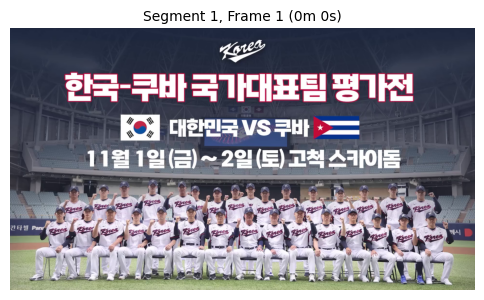

Segment 1, Frame 2 (0m 3s): 해당 영상은 야구 경기의 한 장면을 담은 이미지입니다. 이미지에는 야구 선수들이 경기 중에 위치하고 있는 장면이 포착되어 있습니다.

이미지에는 투수가 투구 동작을 하고, 타자가 준비 자세로 대기하고 있는 순간이 포착되어 있습니다. 투구 동작을 하는 투수는 투구 동작을 최종 준비하며 공을 던질 준비를 하고 있습니다. 반대편에는 타자가 타석 안에서 자세한 준비 자세로 공을 기다리고 있습니다.

이미지 속 선수들은 흰색 유니폼을 입고 있으며, 선수들이 착용한 헬멧과 글러브 등의 야구 장비가 잘 보입니다. 경기장 배경에는 관중들의 모습도 보이며, 야구 경기가 열렸음을 짐작할 수 있습니다.

이미지 속 선수



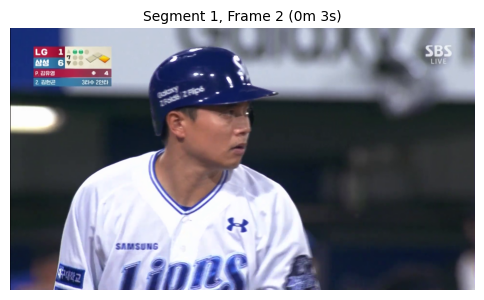

Segment 1, Frame 3 (0m 6s): 야구 경기 비디오 프레임 속에서는 선수들이 필드에 서있거나 움직이며, 공을 던지거나 치는 장면이 포착되고 있습니다. 선수들은 각팀마다 다른 색깔의 유니폼을 착용하고, 모자를 쓰고 장갑을 착용하고 있습니다. 그들은 각각 주자와 선수로 구분되며, 투수는 투구 동작을 하고 있습니다.

비디오 프레임 속에서는 주자가 베이스를 밟고 있는 모습도 보이며, 각 선수들은 자신의 역할에 따라 그라운드 내에서 특정 위치에 배치되어 있습니다. 경기 상황은 주자들의 위치, 볼 카운트, 아웃 횟수 등을 통해 파악할 수 있습니다.

이미지 속에서는 선수들의 동작과 위치뿐만 아니라 경기 상황, 장비 등도 자세히 관찰



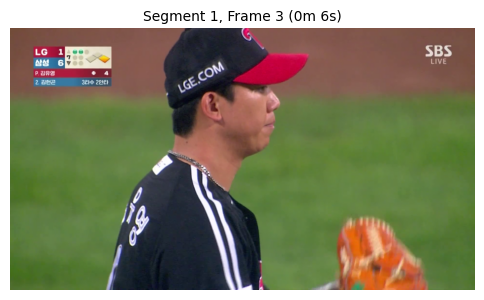

Segment 1, Frame 4 (0m 9s): 야구 경기에서는 두 팀의 선수들이 경기장에 위치하고 있습니다. 투수는 투구동작을 하고 있고 타자는 준비 동작을 하고 있습니다. 타자는 배트를 들고 있고, 타구를 치기 위해 기다리고 있습니다. 주자들은 각각 1루와 3루에 위치하고 있습니다. 야구장은 화창한 날씨고 관중들이 많이 찾아와 경기를 관람하고 있습니다. 경기 상황은 아홉이닝 경기 중 하나의 이닝에서 진행 중인 것으로 보입니다. 각 팀은 기회별로 승부가 되고 있습니다. 이야기가 집중된 순간도 역시 야구장은 열정적인 분위기로 가득 차 있습니다. 함성과 박수가 끊이지 않고 경기는 계속되고 있습니다.



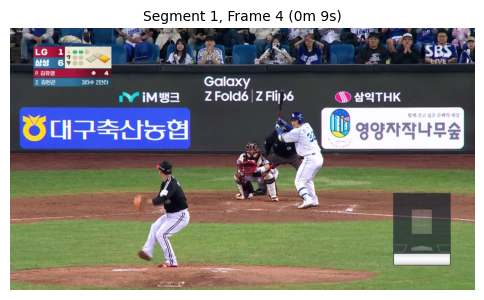

Segment 1, Frame 5 (0m 12s): 이 야구 경기 비디오 프레임에서는 두 팀의 선수들이 야구 경기를 벌이고 있습니다. 비디오에서는 타구가 발생한 순간으로, 타자가 야구 배트를 휘두르는 동작이 포착되었습니다. 주자들은 베이스에 서있고, 수비수들은 각 위치에 배치되어 있습니다. 야구장은 미리 타석에 진 미로가 그려져 있는 등 깔끔하게 정비되어 있습니다. 선수들은 각기 다른 팀 유니폼을 입고 경기 중이며, 야구 모자와 글러브 등 필수 장비를 착용하고 있습니다. 결정적인 순간을 잡은 이 프레임은 야구 경기의 재미와 긴장감을 잘 전달하고 있습니다.



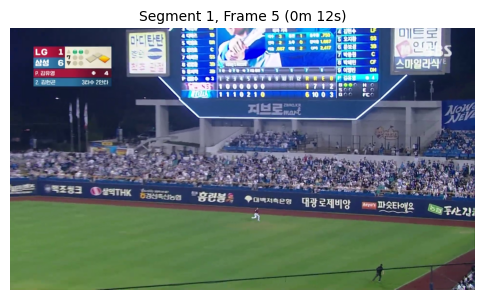

Segment 1, Frame 6 (0m 15s): 이 야구 경기 비디오에서는 레프트 투수로 등판한 투수가 타자와의 맞대결을 준비하고 있습니다. 투수는 마운드 위에 올라서서 마운드 주변을 한 바퀴 돌며 타자와의 맞대결을 위해 준비하고 있습니다. 타자는 배트를 휘두르며 투수를 향해 시선을 고정시키고 있습니다. 주자는 1루에 서 있으며 3루 코치가 주자에게 신호를 보내고 있습니다. 야구장은 바닥이 풀로 되어 있고, 경기 상황은 아웃 카운트가 0이며 볼카운트는 1입니다. 선수들은 각자의 역할에 집중하고 경기를 준비하고 있습니다.



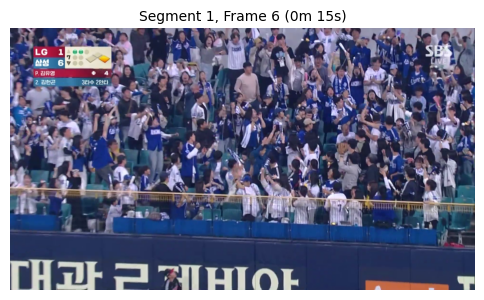

Segment 1, Frame 7 (0m 18s): 이 비디오 프레임은 야구 경기의 한 장면을 보여줍니다. 이 장면에서는 투수가 타자에게 공을 던지고 있습니다. 타자는 투수가 던진 공을 바라보며 준비 동작을 하고 있습니다. 주심은 홈플레이트 근처에 서 있으며, 주자들은 베이스에 위치하고 있습니다. 투수는 흰색 유니폼을 입고 있고, 타자는 회색 유니폼을 입었습니다. 투수의 손에는 공을 잡고 공을 던지기 위해 허리 뒤로 팔을 휘둘러 올리고 있습니다.

전경의 배경에는 관중석과 라이트가 비추고 있으며, 경기장의 분위기가 느껴집니다. 이 장면은 역동적이고 긴장된 분위기를 전달합니다. 플레이어들은 경쟁을 위



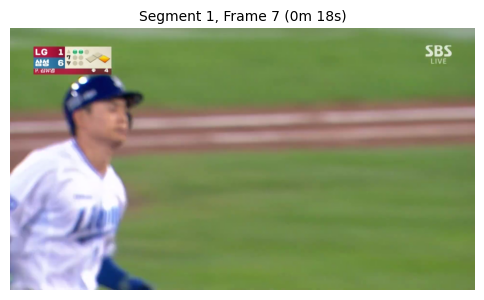

Segment 1, Frame 8 (0m 21s): 이 비디오 프레임은 야구 경기 중 선수들의 동작과 위치를 보여줍니다. 경기는 배열된 방식으로 진행되고, 공을 던지거나 치기 위해 준비하는 선수들이 명백히 나타납니다. 투수는 마운드에 서 있고, 타자는 타격 위치에 준비하고, 주자는 베이스에 위치해 있습니다. 또한, 감독과 코치들도 두루볼 수 있습니다. 특히, 타자의 야구 방망이와 투수의 글러브와 구술포도 장비는 그들이 경기에 적극 참여하고 있다는 사실을 강조해줍니다. 전체적으로, 이 비디오 프레임은 야구 경기의 다양한 측면을 자세히 보여주고 있습니다.



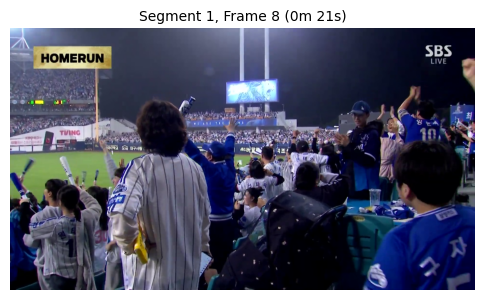

Segment 1, Frame 9 (0m 24s): 이 영상은 야구 경기에서 발생한 장면을 보여주는 것 같습니다. 선수들이 구장에 서서 경기를 벌이고 있습니다. 주로 빨간색과 파란색 유니폼을 입은 선수들이 보입니다.

한 선수는 투수 그룹에 속해 있는 것으로 보이며, 투구를 위해 준비 중인 것으로 보입니다. 그 옆에는 타자 그룹이 서 있고, 타석을 준비하고 있는 듯한 모습입니다.

그 외에도 구장 주변에는 관객들이 앉아 경기를 지켜보고 있는 모습도 보입니다. 구장은 초록색으로 잔디가 깔려 있으며, 태양이 비쳐 선수들의 그림자가 길게 그려지고 있습니다.

이 영상은 야구 경기의 한 순간을 생생하게 담아냈다고 할 수 있습니다. 선수들의 동작, 위치, 장비, 경기 상황 등이 자세하게 담긴



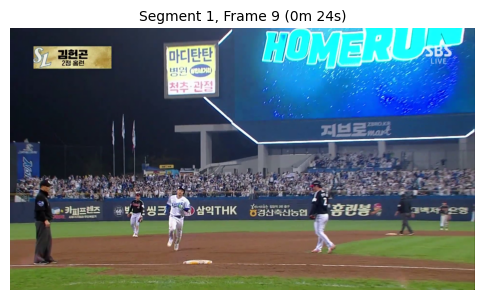

Segment 1, Frame 10 (0m 27s): 이 야구 경기 비디오 프레임에서는 두 팀의 선수들이 경기 중에 공을 던지고, 타격을 하는 등 다양한 동작을 보여주고 있습니다. 첫 번째 팀은 파란색 유니폼을 입은 팀이며, 두 번째 팀은 흰색 유니폼을 입은 팀입니다.

비디오 프레임에서는 그라운드의 초막도 및 홈플레이트가 잘 보이며, 그라운드의 풀빔이 깔끔하게 정리되어 있습니다. 선수들은 배트를 들고 타격 준비를 하거나, 야수로서 반응하는 모습이 잘 보여집니다.

파란색 팀의 투수는 공을 손에 들고 집중하는 모습이며, 타자는 타겢 준비를 위해 발바닥을 밟고 머리를 조금 끄는 동작을 하고 있습니다. 그와 동시



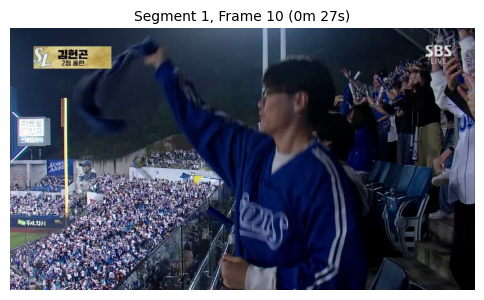

Segment 1, Frame 11 (0m 30s): 이 영상은 야구 경기가 진행되는 모습을 보여주고 있습니다. 선수들은 각각 다른 색상의 유니폼을 입고 있고, 야구 모자를 쓰고 장비를 착용하고 있습니다. 비디오 프레임에서는 타자와 투수가 준비 동작을 하고 있으며, 주자는 베이스를 향해 뛰고 있습니다. 주자는 베이스볼 그립을 손에 쥐고 있고, 야수들은 수비 포지션에 배치되어 공을 받아내기 위해 기다리고 있습니다. 야구장의 그린 그라운드와 바깥 쪽의 스탠드가 잘 보이며, 경기 상황을 나타내기 위해 스코어보드가 배경에 있는 것으로 보입니다. 경기가 곧 시작될 것으로 예상되며, 야구 팬들은 이미 클럽 색상의 모자나 유니폼을 입은 채 경기를 기다리고 있



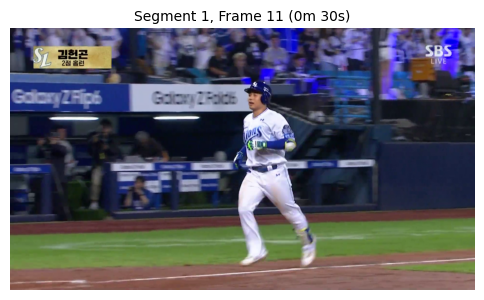

Segment 1, Frame 12 (0m 33s): 위의 야구 경기 비디오 프레임에서는 두 팀의 선수들이 경기를 하고 있습니다. 홈플레이어는 블루 유니폼을 입고 있는 것으로 보이며, 외야 수비 포지션에 서 있습니다. 그는 장갑과 야구모자를 착용하고 있습니다. 또한 그의 우측에는 주자가 있습니다. 주자는 그라운드에 떨어진 공을 던지는 홈플레이어를 향해 뛰고 있습니다. 경기장 배경에는 관객들의 모습도 보입니다. 전체적으로 집중된 분위기가 느껴집니다.



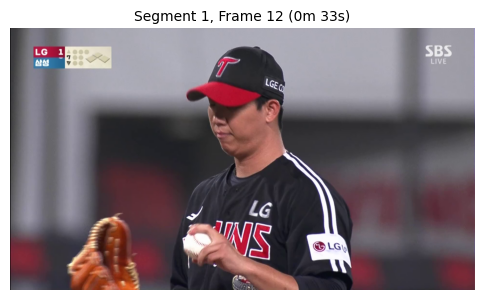

Segment 1, Frame 13 (0m 36s): 이 영상은 야구 경기의 한 장면을 보여주고 있습니다. 영상에서는 야구장의 배경과 두 팀의 선수들이 경기를 하고 있는 것을 볼 수 있습니다.

영상에서 선수들은 각각 다른 팀의 유니폼을 입고 있습니다. 그들은 야구 배트를 들고 있고, 수비 포지션 또는 공격 포지션에 있습니다. 몇몇 선수들이는 상대편 투수와 대면하여 공을 기다리고 있는 것으로 보입니다.

그리고 영상에서는 야구 경기의 한 장면을 보여주고 있습니다. 야구장의 배경과 두 팀의 선수들이 경기를 하고 있는 것을 볼 수 있습니다. 선수들의 동작과 위치, 그리고 경기 상황 등이 자세하고 포괄적으로 나타나 있습니다. 선수들의 장비와 포지션 등을 보면 몇몇 선수는 타석에 서 있고, 다른 선수들은 수비 포



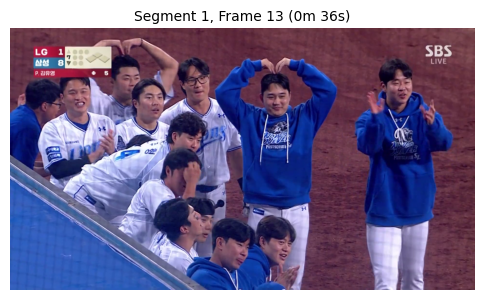

Segment 1, Frame 14 (0m 39s): 이 영상은 야구 경기에서 촬영된 것으로 보입니다. 홈플레이트 주변에서 선수들이 경기를 하고 있는 장면이 보입니다. 주 플레이어가 투구를 하고 있고, 타자가 대기하고 있습니다. 주자들은 각 베이스 주변에 위치해 있고, 수비수들은 어느 정도의 거리에 위치해 있습니다. 선수들은 각 팀의 유니폼을 착용하고 있고, 그라운드는 잘 정돈되어 있습니다. 운동화, 모자, 리본 팔톱, 흰색 손수건 등의 장비를 착용하고 있습니다. 현재 상황에서는 경기가 진행 중인 것으로 보입니다. 선수들의 움직임과 포지션, 장비, 경기 상황 등이 자세히 포착되어 있습니다.



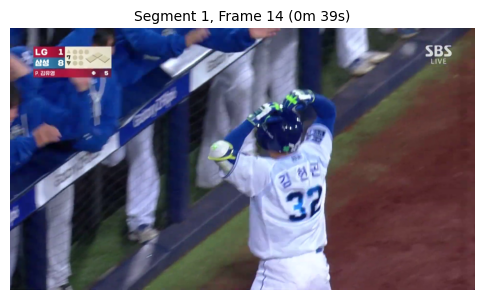

Segment 1, Frame 15 (0m 42s): 이 영상은 야구 경기에서 진행 중인 장면을 담고 있습니다. 영상에서는 선수들이 역동적인 동작을 보이며 야구 경기를 펼치고 있습니다. 

선수들은 각각 다른 팀의 유니폼을 입고 장비를 착용하고 경기 도중에 위치를 변경하며 플레이를 하고 있습니다. 

영상 속 선수들은 야구공을 던지고 받거나 치는 등 다양한 야구 동작을 하고 있습니다. 또한, 각 팀의 선수들이 적극적으로 활동하고 경기 상황을 위해 노력하고 있습니다.

이러한 장면 속에서는 선수들의 열정과 승부욕이 묻어나며 야구 경기의 경쟁적인 분위기가 느껴집니다. 또한, 관중들의 환호와 응원 소리도 들립니다. 

영상은



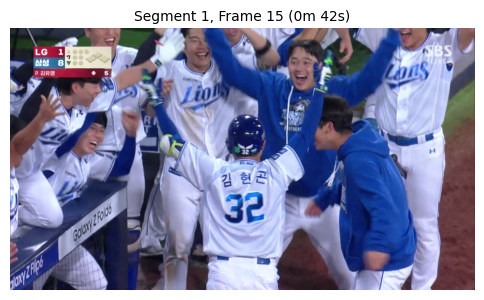

Segment 1, Frame 16 (0m 45s): 해당 야구 경기 비디오 프레임에서는 두 팀이 마운드에 서 있는 상황으로 나타납니다. 투수가 투구 동작을 준비하고 있고 타자가 준비 동작을 하고 있는 것으로 보입니다. 주심이 홈 플레이트 뒤에 위치하고 있고, 주자는 베이스 위에 서 있거나 이동하려는 동작을 하는 것으로 보입니다. 타자의 손에는 배트가 들려 있고, 수비수들은 각각 주자와 주자들을 가로막기 위해 수비 동작을 하고 있습니다. 이러한 장면은 역동적인 야구 경기의 전개를 시각적으로 보여줍니다.



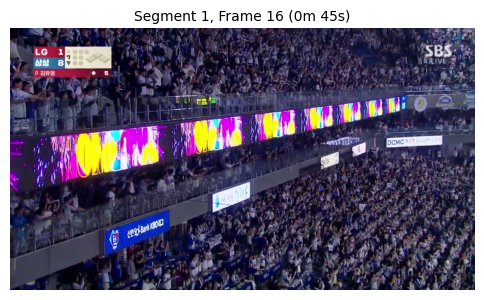

Segment 1, Frame 17 (0m 48s): 이 영상은 야구 경기의 한 장면을 보여주고 있습니다. 선수들은 각 팀의 유니폼을 입고 경기를 벌이고 있습니다. 야구장은 무대가 넓고, 마운드와 홈베이스가 잘 보이는 구조입니다. 현재는 타자와 투수가 준비 동작을 하고 있는 상황으로 보입니다. 타자는 배트를 들고 준비 동작을 하고, 투수는 투구 동작을 준비하고 있는 것으로 보입니다. 반대편에는 주심이 홈플레이트 주변에서 타구 결과를 판단할 준비를 하고 있는 모습입니다. 이 영상을 통해 야구 경기의 긴장된 분위기와 선수들의 열정을 엿볼 수 있습니다.



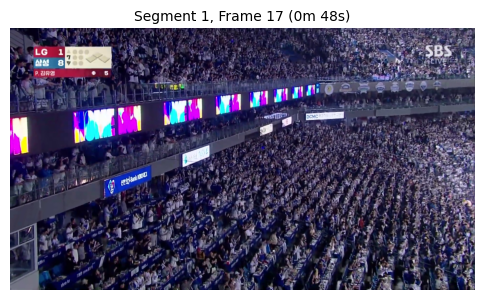

Segment 1, Frame 18 (0m 51s): 이 야구 경기 비디오 프레임에서는 두 팀의 선수들이 경기 중에 모습을 보여줍니다. 홈플레이트 쪽에는 타자가 서 있고, 투수가 투구를 준비하고 있습니다. 주자는 1루 주자이며, 1루 수비수는 베이스에 서서 주자를 가리고 있습니다. 타자는 그리핀스 시애틀 캠오커스 유니폼을 입고 있으며, 빨간색 모자를 쓰고 있습니다. 그의 동작은 타석을 향해서 준비 자세를 취하고 있습니다. 

투수는 뉴욕 양키스 유니폼을 입고 있습니다. 그의 동작은 투구 동작을 준비하고 있는 것으로 보입니다. 수비수들은 각 베이스 주변에 위치하여 주자를 가리고 있습니다. 그들은 각자의 수비 포지션을 취하고 있으며, 긴 레



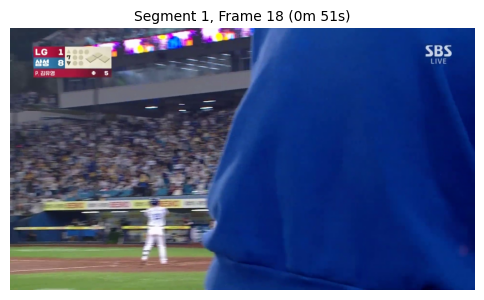

Segment 1, Frame 19 (0m 54s): 해당 야구 경기 비디오 프레임에서는 주로 홈플레이트 쪽에서 야수가 수비를 하고 있는 장면이 보여집니다. 먼저 홈플레이트 근처에 야수가 준비 동작을 하고 있습니다. 야수는 방망이를 들고 야구 경기를 위해 준비하고 있습니다. 주자가 주루를 시도하고 있고 볼이 홈플레이트 쪽으로 던져지고 있습니다. 주자와 야수 사이의 교전 상황이 이루어지려고 하고 있습니다. 야수는 주자가 홈플레이트 쪽으로 달려오는 동안 수비 동작을 준비하고 있습니다. 뒤에는 야구장과 관객석이 보여지고 있습니다. 이 장면은 경기의 긴장감과 스릴을 전달하고 있습니다. 같은 시간에 다양한 상황이 한 장면에서 펼



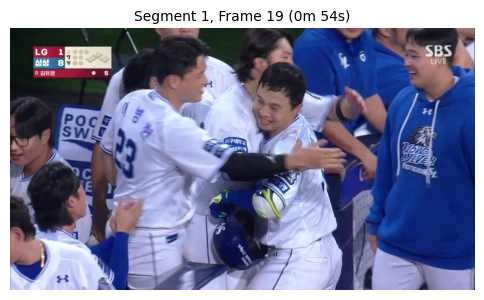

Segment 1, Frame 20 (0m 57s): 이 야구 경기 비디오 프레임에서는 투수가 공을 던지고, 타자가 스윙하는 모습이 포착되고 있습니다. 투수는 화이트색 유니폼을 입고, 야구 모자를 쓰고 있으며, 공을 던지는 동작을 하고 있습니다. 타자는 그린색 유니폼을 입고, 배팅 헬멧을 쓰고 있으며, 스윙 동작을 하고 있습니다. 주자는 1루 주자로, 빨간색 유니폼을 입고, 야구 모자를 쓰고 있습니다. 야수들은 파란색 유니폼을 입고, 야구 모자를 쓰고 있으며, 각각 주자 및 타자 주변에 배치되어 수비 동작을 하고 있습니다. 경기장은 잔디가 풀려 있는 야구 구장으로, 경기는 타격 직전 상태로 진행 중입니다. 볼은 공



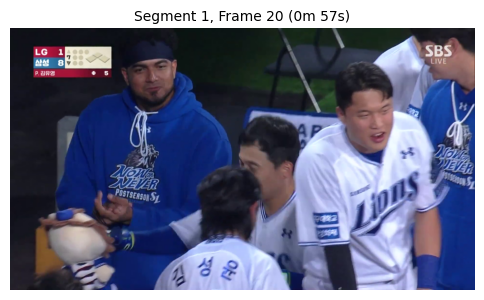


Analyzing segment 2/2
Segment 2, Frame 1 (1m 0s): 이 영상은 야구 경기의 한 장면을 담고 있습니다. 선수들은 야구 경기를 진행하고 있으며, 그들의 동작과 위치를 살펴볼 수 있습니다. 야구장은 노란색 베이스볼 그라운드로 구성되어 있고, 선수들은 각각 파란색과 녹색 유니폼을 입고 경기를 하고 있습니다.

이 영상에서는 타자가 투수로부터 공을 받아 쳐서 베이스를 치고 있는 장면을 볼 수 있습니다. 타자는 야구배트를 들고 있다. 주자들은 각기 다른 베이스에 서 있으며, 야수들은 각각의 수비 위치에 배치되어 있습니다. 병살타 상황에서는 주자들이 베이스에 서 있고, 야수들이 수비 포지션을 취하고 있습니다.

야구장의 왼쪽에는 여러 관중이 앉아 경기를 관람하



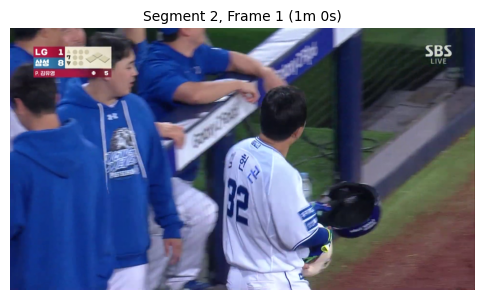

Segment 2, Frame 2 (1m 3s): 이 비디오 프레임은 야구 경기를 보여줍니다. 홈플레이트에서 투수가 공을 던지고 있고, 타자가 준비를 하고 있습니다. 타자는 검은색 유니폼을 입고 모자를 쓰고 있으며, 몸을 앞으로 기울여 공을 치려고 준비하고 있습니다. 투수는 흰색 유니폼을 입고 장갑을 착용하고 있으며, 공을 던지고 있습니다.

경기장은 잔디로 마련된 야구 필드로, 타구가 쳐지면 뒷 배경에는 스폰서들의 광고판과 관중석이 보입니다. 주자도 대기 중인데, 1루 주자는 주황색 유니폼을 입고 바이베르 프로텍터와 헬멧을 착용하고 있습니다.

이 비디오 프레임은 야구 경기의 긴장감과 스피드를



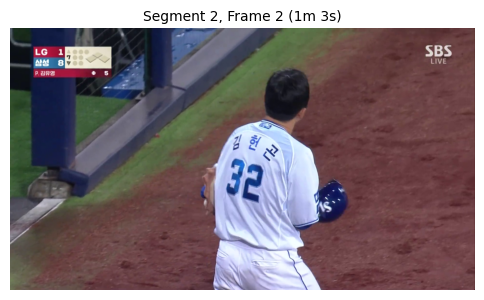

Segment 2, Frame 3 (1m 6s): 해당 영상은 야구 경기의 한 장면을 보여주고 있습니다. 홈 플레이트 근처에 배터가 서 있고, 야수가 포지션을 취해 대기하고 있습니다. 타구가 공중으로 올라가고 있으며, 운인이 흰색 윌슨 장갑을 착용하고 있습니다. 공중에서 허공으로 뛰어오르는 야수를 바라보고 있는 배터의 모습이 촬영되어 있습니다. 이 장면은 바깥야구 경기장에서 진행되고 있으며, 미리 헨더슨 시티 체인인 강제로 된 라이프리 탑 스웨터와 유니폼을 착용한 야수와 배터가 경기를 하고 있는 것으로 보입니다.



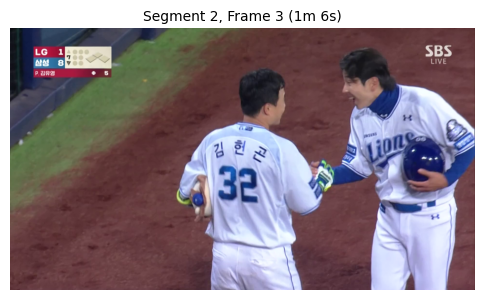

Segment 2, Frame 4 (1m 9s): 이 야구 경기 비디오 프레임에서는 한 선수가 투구를 하고 있습니다. 그의 자세는 승패 라인에서 약간 왼쪽에 서 있으며, 공을 빼내기 위해 팔을 올려드리고 있습니다. 머리에 모자를 쓰고 흰 유니폼과 회색 바지를 입고 있습니다. 주위에는 두명의 주자가 1루와 3루에 서 있고, 타자가 타석에 있는 것으로 보입니다. 왼쪽 까지 스코어보드가 보이며, 경기가 진행 중인 것으로 생각됩니다. 이 비디오 프레임은 경기 상황을 분석하는 데 도움이 될 것입니다.



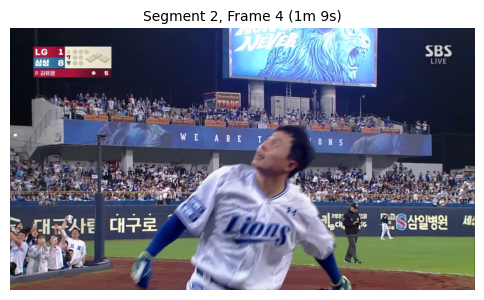

Segment 2, Frame 5 (1m 12s): 이 프레임은 야구 경기에서 투수가 공을 던지고 있는 순간을 담고 있습니다. 선수는 흰색 유니폼과 파란색 모자를 착용하고 있습니다. 그리고 야구글러브를 착용하고 있는 것으로 보입니다. 주자는 야구 베이스와 서있는 주자도 포함되어 있습니다. 경기장은 녹색 잔디의 야구 그라운드이며, 배경에는 관중석이 보입니다. 이 장면은 공을 던지고 있는 투수와 대기 중인 주자, 경기장의 분위기를 잘 담아내고 있습니다.



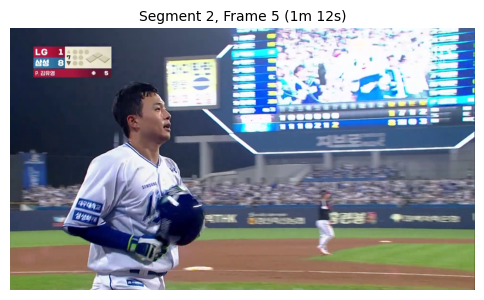

Segment 2, Frame 6 (1m 15s): 이 비디오 프레임은 야구 경기를 보여주고 있습니다. 홈 플레이트 앞에 공을 던지고 있는 투수가 있고, 타자는 배트를 들고 기다리고 있습니다. 주자들은 각각 1루, 2루, 3루에 위치하고 있으며 수비수들은 각각 포지션에 배치되어 있습니다. 경기 상황은 아웃카운트와 볼카운트를 알 수 없습니다. 선수들은 모두 야구 유니폼을 착용하고 있고, 태그링, 헬멧, 배트 등의 야구 장비를 착용하고 활동하고 있습니다. 선수들의 동작은 신속하고 정확하며 경기 진행에 집중하고 있는 것으로 보입니다. 야구장은 균일한 잔디로 되어 있고, 경기는 밝은 햇빛 속에서 진행되고 있습니다.



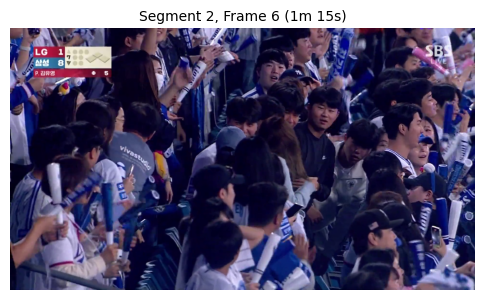

Segment 2, Frame 7 (1m 18s): 이 영상은 야구 경기에서 찍힌 것으로 보이며, 선수들이 경기 중인 장면을 보여줍니다.

몇몇 선수들이 주목할 만한 동작을 하고, 경기 중에 위치를 바꾸고 있습니다. 또한, 장비로 보이는 야구 모자와 유니폼을 착용하고 있습니다. 야구 경기가 진행 중인 것으로 보이며, 선수들이 경기 상황에 따라 움직이고 있습니다.

그리고 야구장에서 촬영된 이 프레임의 특징은 선수들의 다양한 동작과 위치, 장비, 야구장의 분위기 등이 자세하고 다채롭게 담겨 있으며, 경기의 진행 상황을 포괄적으로 나타내고 있습니다.



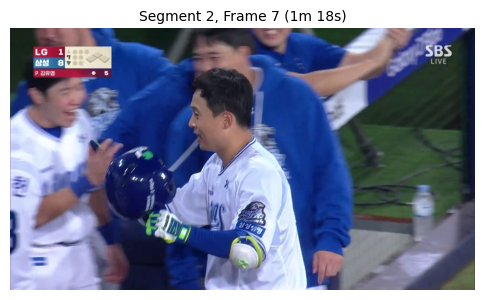

Segment 2, Frame 8 (1m 21s): 이 야구 경기 비디오 프레임에서는 두 선수가 약간 다른 포지션에 서 있습니다. 하나는 투수이고 다른 하나는 타자입니다. 투수는 주전자 부분에 서서 공을 던지고 있고, 타자는 타자 박스 안에 섰습니다. 투수는 우투수로 보이며, 블루색 유니폼을 입고 있습니다. 투구 동작을 위한 준비 과정 중인 것으로 보입니다. 타자는 배트를 손에 들고 상체를 회전시키며 준비 상태입니다. 경기장은 풀그라운드로 보이며, 아직 경기 중이며 경기 상황은 알 수 없습니다. 그 외에 추가로 확인할 수 있는 정보는 장비나 선수들의 표정 등이 있습니다.



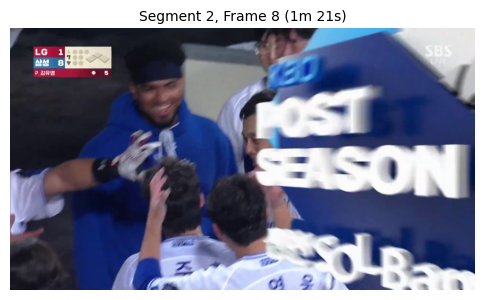

Segment 2, Frame 9 (1m 24s): 해당 이미지는 야구 경기 현장에서 찍은 프레임으로, 다수의 선수들이 경기 중인 장면을 보여줍니다. 중앙에는 타격을 기다리고 있는 타자가 보이고, 그 주변에는 주자가 순차적으로 서서 기회를 기다리고 있습니다. 타자와 주자들은 흰색 유니폼과 모자를 착용하고 있으며, 타자는 방망이를 들고 준비 중인 모습을 보여줍니다. 주자들은 선수들과 주자 지점 사이의 거리를 유지하며 주목하고 있습니다. 또한, 주자 지점 가까이에는 각 팀의 코치가 위치하여 선수들에게 지시를 내리고 있습니다. 주변에는 야구장의 그린과 관중석이 배경으로 나타나며, 경기가 진행되고 있는 것을 시각적으로 전달하고 있습니다. 전체적으로 활발한 야구 경기 현



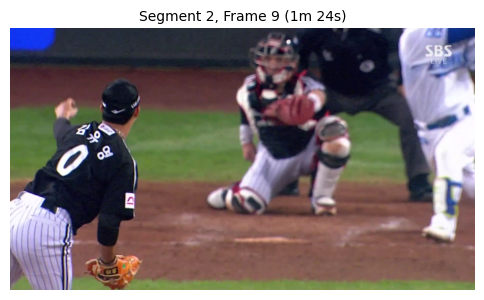

Segment 2, Frame 10 (1m 27s): 위의 이미지는 야구 경기에서 선수가 투구하기 전의 장면을 보여줍니다. 선수는 마운드 위에 서서 투구 동작을 준비하고 있습니다. 그의 어깨 간겴이 넓은 모습으로 투구 준비를 하고 있습니다. 빨간색 유니폼을 입고 있으며, 투구를 위해 공을 올리고 자세를 고수하며 모습이 나타나고 있습니다.

그의 표정은 몰락없이 집중한 모습을 보여주고 있습니다. 그의 장비로는 모자와 방망이를 들고 있으며, 야구 유니폼을 착용하고 있습니다. 그의 몸은 약간 휘어져 있으며, 마운드 위에서 발을 땅에 고정시킨 모습입니다.

경기장 배경에는 관중석과 그 뒤로는 야구장의 풍경이 나타나고 있습니다. 이 선수는 공을 잡아



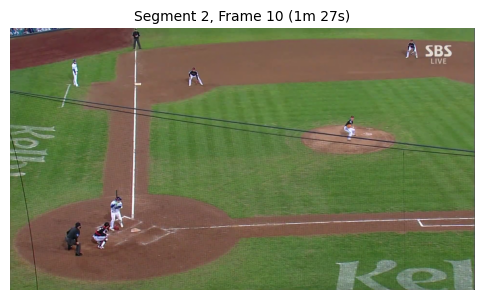

Segment 2, Frame 11 (1m 30s): 야구 경기에서 한 선수가 타격을 시도하고 있는 장면입니다. 해당 선수는 야구 방망이를 들고 타격 준비 동작을 하고 있습니다. 상대 투수는 공을 던지는 동작을 하고 있습니다. 구장은 초말 3회초로 경기 상황은 초반에 해당합니다. 그 주변엔 주자나 선수들이 베이스 주변에 배치되어 경기를 준비하고 있습니다. 또한, 경기 관중들의 모습도 파악할 수 있습니다. 경기가 이어지고 있음을 알 수 있는 이미지입니다.



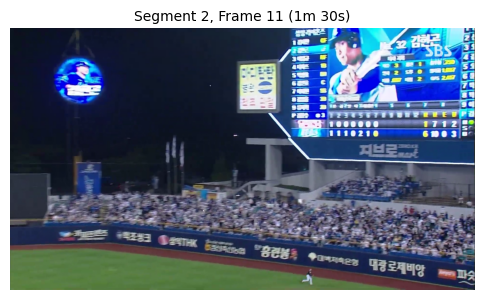

Segment 2, Frame 12 (1m 33s): 이 영상은 야구 경기의 한 장면을 담은 프레임입니다. 이 장면에서는 주자가 1루 쪽을 향해 뛰고 있습니다. 주자는 힘차게 뛰면서 앞을 향해 보고 있습니다. 주자는 강렬한 표정으로 경기에 집중하고 있는 것으로 보입니다. 주자의 모습은 아주 다이내믹하며, 경기 상황이 매우 긴장된 상태임을 보여줍니다. 주자는 전체적으로 얇은 청운동복을 입고 있으며, 목에는 흰색의 목줄을 착용하고 있습니다. 또한 주자는 검은색 모자를 쓰고 있으며, 플레이어들과 환경과의 상호작용에서 나타나는 감정과 표정이 자세하게 담겨 있습니다. 경기장 장애물이나 배경에는 그림자가 떨어지고 있으며, 낮은 햇살을 받고 있



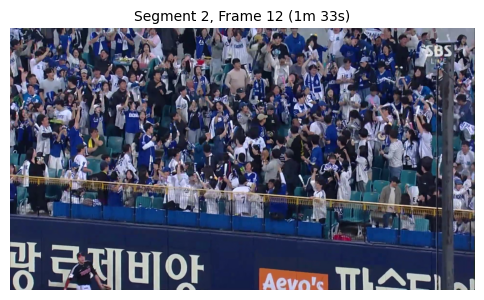

Segment 2, Frame 13 (1m 36s): 야구 경기에서 빠른 진행 속도와 높은 집중력이 요구되는 상황에서 선수들은 경기 동안 다양한 동작을 보입니다.

이 영상에서는 먼저 투구를 하는 투수의 모습이 담겨 있습니다. 투수는 홈베이스 쪽에서 약 18m 정도 떨어진 마운드 위에서 공을 던지는 자세를 취하고, 승부가 결정되는 중요한 순간을 맞이했습니다. 그 옆에는 포수가 앉아 있어 투수에게 신호를 보내는 역할을 하고 있습니다.

그리고 배경의 주자들은 한 야구팀의 선수들로, 주자 1루에 있는 선수는 2루로 뛰어가는 모습을 보여주고 있습니다. 주자 1루에 있는 선수는 주자 2루부터 3루까지 순조롭게 진루할 수 있도록 능숙



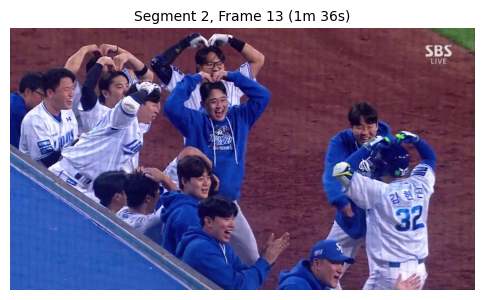

Segment 2, Frame 14 (1m 39s): 이 야구 경기 비디오 프레임에서는 투수와 타자가 준비 중인 장면이 포착되어 있습니다. 타자는 타석에 입장하여 타격 준비를 하고 있으며, 투수는 투구 준비 동작을 하고 공을 손에 들고 있습니다. 야구장의 배경으로는 관중석과 야구장의 그림이 그려진 네트가 나타나고 있습니다. 타자는 검은 색 바지와 흰 셔츠를 입고 헬멧을 착용하고 있으며, 타석에 위치해있는 것으로 보입니다. 투수는 흰색 유니폼에 파란색 바지를 입고 공을 손에 들고 타자를 향해 공을 던지려는 모습을 보여줍니다. 이러한 장면은 야구 경기의 긴장감과 경기 진행 상황을 자세히 전달하고 있습니다.



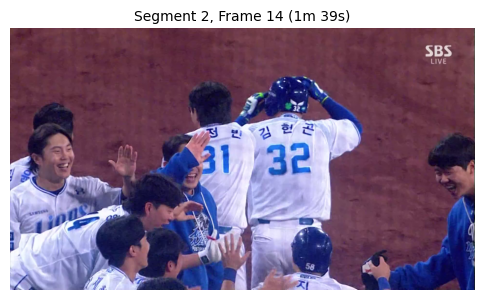

Segment 2, Frame 15 (1m 42s): 이 영상은 야구 경기에서 찍힌 비디오 프레임일 것으로 추측됩니다. 선수들은 야구 경기 중에 위치에 따라 다양한 동작을 보일 것으로 예상됩니다. 장비로는 모자, 유니폼, 야구글러브, 야구배트, 야구공 등이 사용될 것으로 예상됩니다. 경기 상황은 야구 경기 중이므로 선수들이 야구 필드에 위치하거나 공을 던지거나 타격을 하는 등의 행동을 할 것으로 예상됩니다. 이 프레임에서는 던지는 선수나 수비하는 선수 등 다양한 동작이 포착될 것으로 생각됩니다.



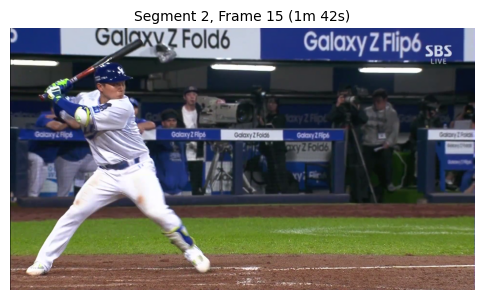

Segment 2, Frame 16 (1m 45s): 이 영상은 야구 경기의 한 장면을 담은 프레임입니다. 프레임 속에는 두 명의 야구 선수가 보입니다. 왼쪽 선수는 볼을 잡기 위해 몸을 앞으로 기울이고 있고, 오른쪽 선수는 약간 뒤로 물러나서 경기 상황을 지켜보고 있는 것으로 보입니다. 두 선수는 각기 다른 팀의 유니폼을 입고 있습니다.

왼쪽 선수는 검은색 모자와 하얀색 상의, 회색 바지를 입고 있습니다. 오른쪽 선수는 회색 모자와 하얀색 상의, 회색 바지를 입고 있습니다. 두 선수 모두 왼손에 글러브를 착용하고 있습니다.

경기장은 푸른 하늘 아래에 있으며, 바닥은 녹색인 것으로 보입니다. 선수들의 주위에는 관중석이 보이지만, 관중들은 흐릿하게



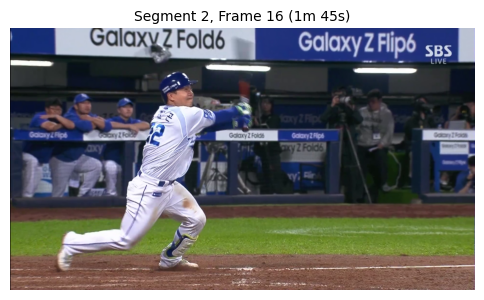

Segment 2, Frame 17 (1m 48s): 이 야구 경기 비디오 프레임에서는 투수가 공을 던지고 있는 장면을 볼 수 있습니다. 투수는 흰색 유니폼을 입고 있고, 머리에 모자를 쓰고 있습니다. 그의 팔꿈치 각도와 공을 잡는 손가락의 위치를 보면 공을 커브볼이나 슬라이더로 던지고 있는 것으로 보입니다. 타자는 타석에 누워 있고 준비 동작을 하고 있는데, 그의 자세와 눈치를 보면 스트레이트 또는 파스트볼을 예상하고 있는 것으로 보입니다. 야구장의 그린 그라운드와 그 주변의 관중석이 잘 보이며, 경기는 아직 초반 단계라는 것을 알 수 있습니다. 경기 상황은 경기 초반이므로 스코어가 0-0으로 비교적 접전이 예상되는 것으로 보입니다. 야구



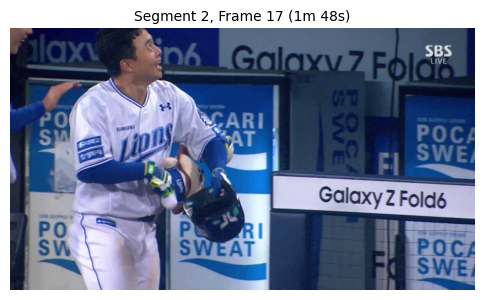

Segment 2, Frame 18 (1m 51s): 이 비디오 프레임은 야구 경기에서 한 선수의 야구방망이를 휘두르는 모습을 보여줍니다. 이 선수는 야구 볼을 치기 위해 준비를 하고, 마운드에 서 있는 상대 투수로부터 공을 받아들이고 있습니다. 경기장은 뒤쪽에서 관중들이 야구 경기를 관람하고 있는 것으로 보입니다. 선수는 경기장의 그라운드 위에 서 있으며, 가운데 안팎과 우측으로 약간 돌아가 있다. 선수는 청색 유니폼과 회색 바지를 입고 있습니다. 그의 야구모자는 양 옆으로 살짝 삐져나와 있습니다. 그의 짧은 머리카락은 에메랄드 녹색 색조의 그라운드와 대조를 이룹니다. 선수는 왼손으로 야구 방망이를 잡고 공을 향해 휘두르



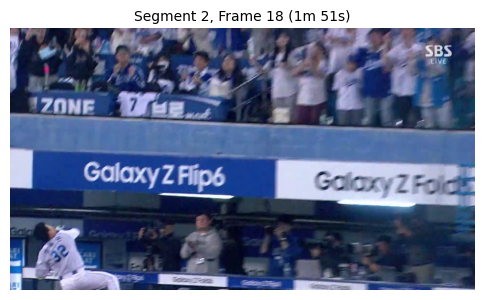

Segment 2, Frame 19 (1m 54s): 이 영상은 야구 경기의 한 장면을 보여주고 있습니다. 홈플레이트 주위에는 야수와 선수들이 모여있고, 투수가 공을 던지고 있습니다. 투수는 흰색 박스 안에서 공을 잡아 던지고 있으며, 타자는 배트를 가지고 있는 모습입니다. 주자들은 베이스에 서 있습니다. 야수들은 각기 다른 방향을 바라보고 있으며, 다양한 자세와 포즈를 취하고 있습니다. 홈플레이트에서는 공이 투수의 손에서 발사되고, 타자는 이를 기다리고 있습니다.

선수들은 귀여운 제비 옷을 입고 있으며, 야구 모자를 쓰고 있습니다. 그들은 활기차고 열정적으로 경기에 참여하고 있습니다. 경기장은 녹색 잔디밭으로 둘러싸여 있고, 배경엔 관중석



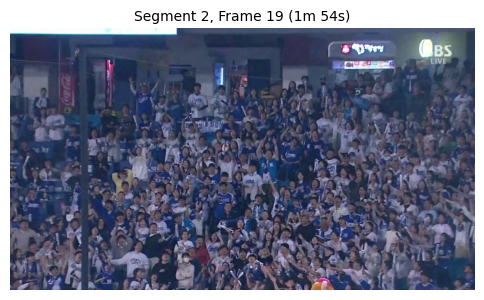

Segment 2, Frame 20 (1m 57s): 이 영상은 야구 경기를 보여주는 것으로 보입니다. 영상 속 선수들은 무적의 장비를 착용하고, 경기 상황을 주시하고 있습니다. 그들은 야구장에서 다양한 포지션에서 활약하며 경기를 펼치고 있습니다. 수비수는 야구 장비를 착용하고 팀원과 소통하며 공이 나오기를 기다리고 있습니다. 한 선수는 타자로 나와 타격을 준비하고 있습니다. 그의 손에는 배트가 있습니다. 그 옆에는 투수가 공을 던지기를 기다리고 있습니다. 경기장은 풀밭과 흙으로 되어 있습니다. 이야기에서 알아낸 모든 것들을 토대로 선수들은 열심히 경기를 펼치고, 경기장의 분위기는 긴장되어 있습니다. 이러한 모습은 야구 경기의 열기를 느낄 수 있는 장면이라고 할



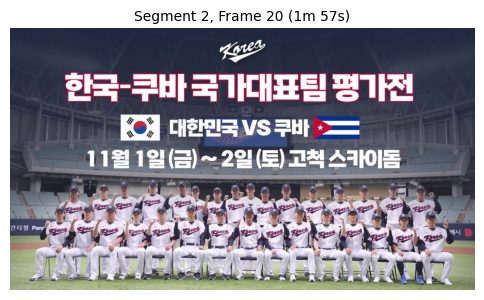

문제 있는 프레임이 없습니다.


In [ ]:
if __name__ == "__main__":
    main()